In [42]:
import requests
from pathlib import Path
from IPython.display import Image, display 
from PIL import Image as PILImage
from tqdm import tqdm

## Generate test set of images and corresponding object detections from mapillary

### SET YOUR OWN CLIENT ID!

In [12]:
client_id = 'ZExRUktGNlV4dElqcHB2cnhLQkVzQzoyMjRkYjZhY2QxOTE0ZDkx'

In [16]:
# define base urls and create image file directory
base = 'https://a.mapillary.com/v3' # base endpoint for mapillary
resolution = '1024'
base_image_url = 'https://images.mapillary.com/{}/thumb-' + resolution + '.jpg'
save_path = '../data/raw/mapillary_'+ resolution + '/'
Path(save_path).mkdir(parents=True, exist_ok=True) 
link_seg = f'{base}/object_detections/segmentations?client_id={client_id}&image_keys='+'{}'

In [ ]:
# todo: generate 10 test images (10 random locations in stuttgart)

  0%|          | 0/8 [00:00<?, ?it/s]

../data/raw/mapillary_1024/JA_4AXrqoaIecJpViomBOA.jpg


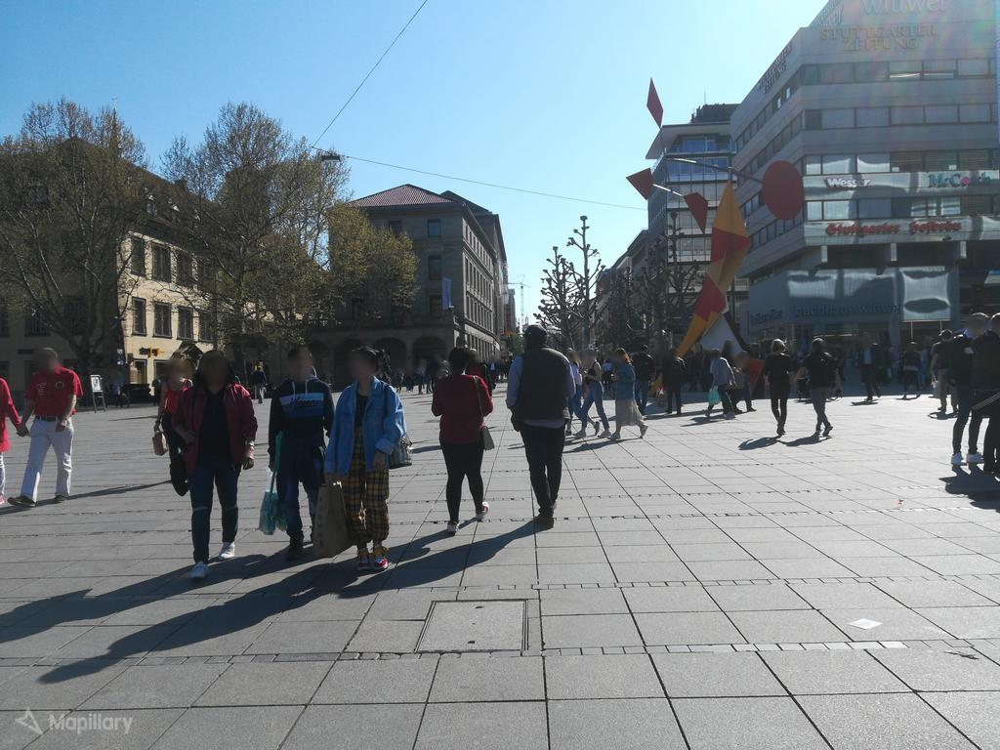

 12%|█▎        | 1/8 [00:12<01:24, 12.02s/it]

../data/raw/mapillary_1024/OK3OH_L2Kdy1xir3UwOsCg.jpg


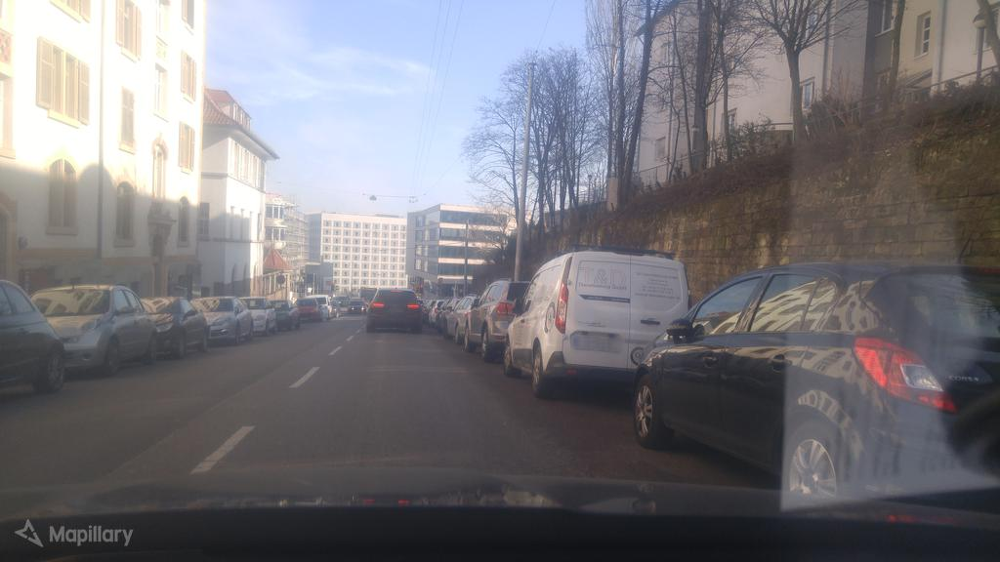

 25%|██▌       | 2/8 [00:25<01:18, 13.08s/it]

../data/raw/mapillary_1024/PB4u5tsj8QLY5TBV_iPA9w.jpg


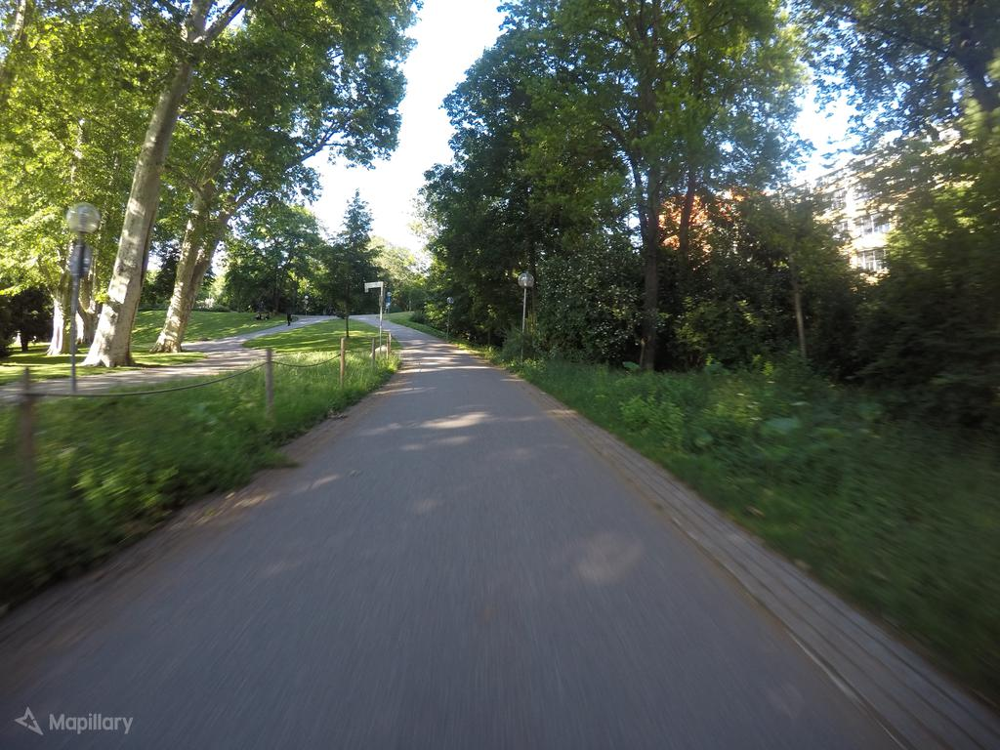

 38%|███▊      | 3/8 [00:39<01:06, 13.32s/it]

../data/raw/mapillary_1024/7b8gh4mSWWLxhzb1Qb_FIg.jpg


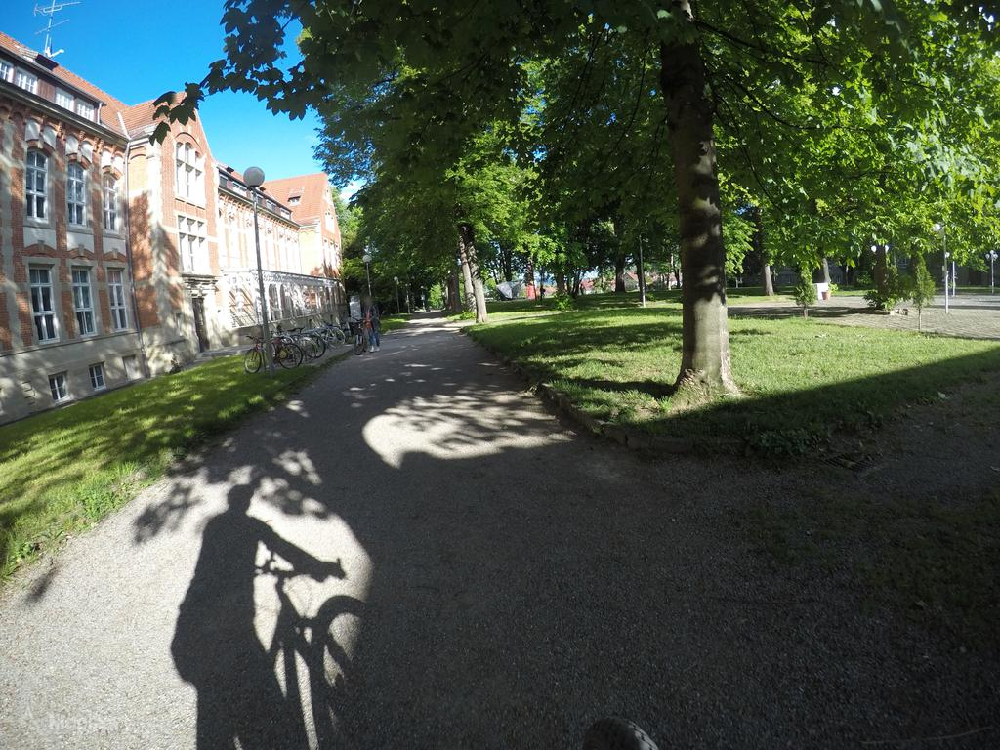

 50%|█████     | 4/8 [00:43<00:38,  9.67s/it]

../data/raw/mapillary_1024/XXjX9AEefUvr-O73l44XAg.jpg


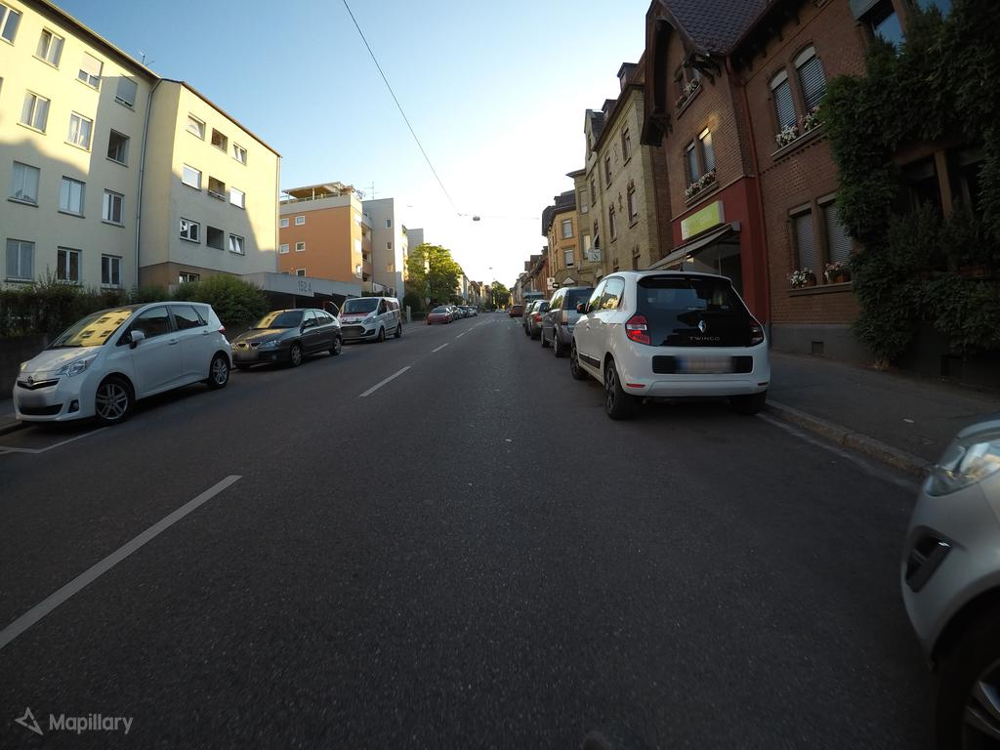

 62%|██████▎   | 5/8 [00:50<00:25,  8.64s/it]

../data/raw/mapillary_1024/m_kiEGQis5-a9LhLgXw-1Q.jpg


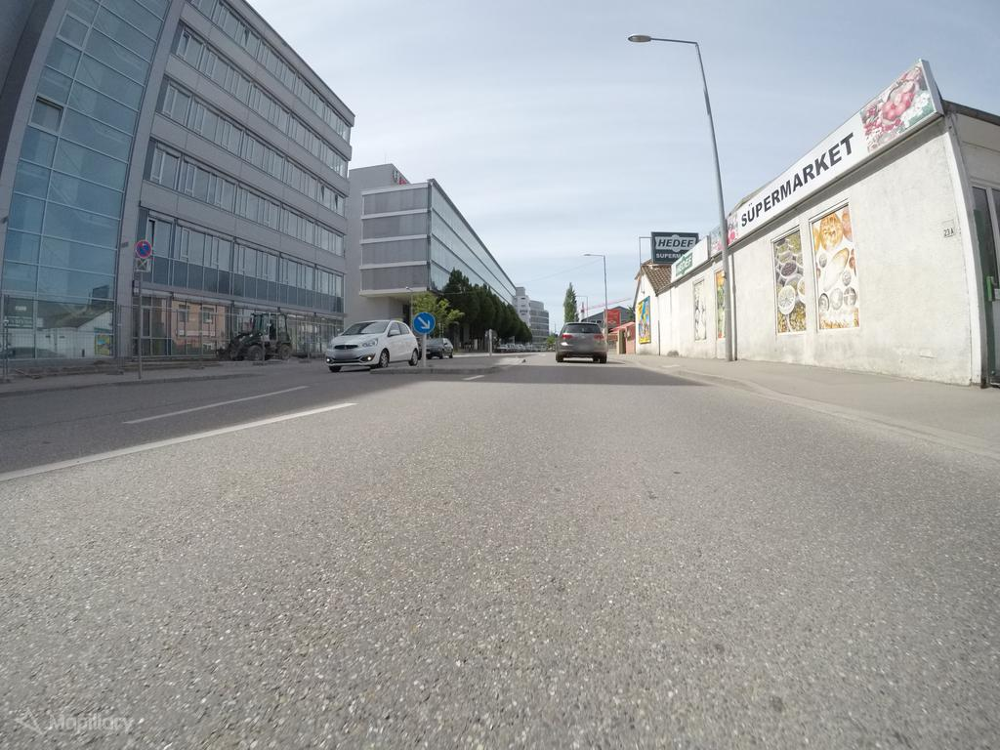

 75%|███████▌  | 6/8 [00:58<00:17,  8.64s/it]

../data/raw/mapillary_1024/gf5Mzjj6wh3HEEaTaficOw.jpg


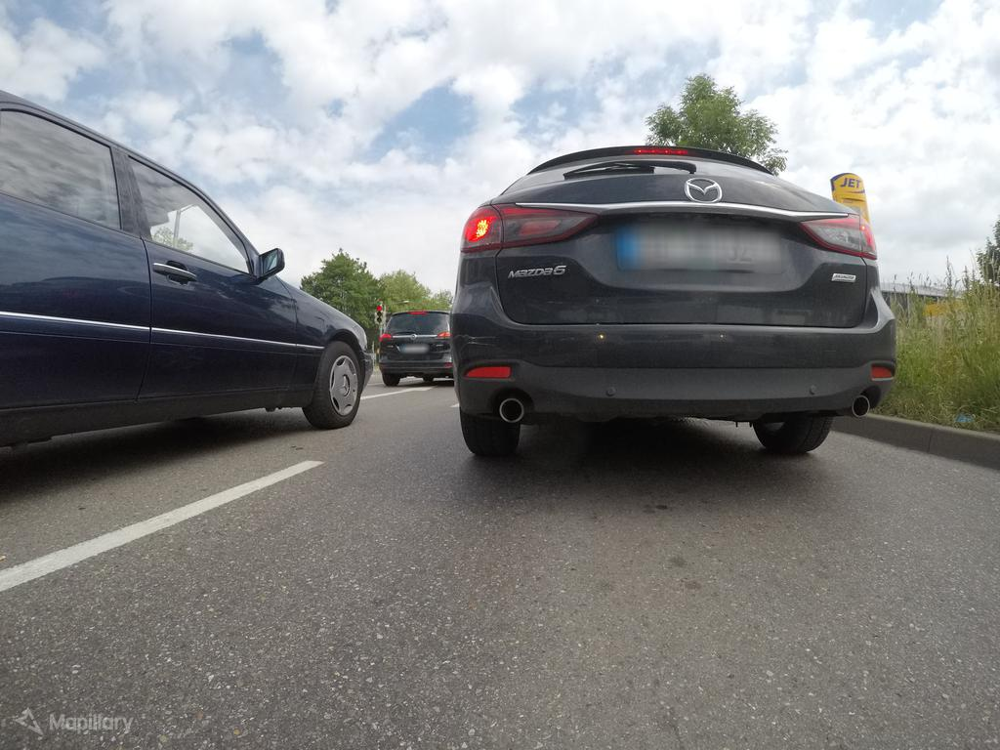

 88%|████████▊ | 7/8 [01:01<00:06,  6.80s/it]

../data/raw/mapillary_1024/X2rZ_IvYvrTTl2Xa1Bexng.jpg


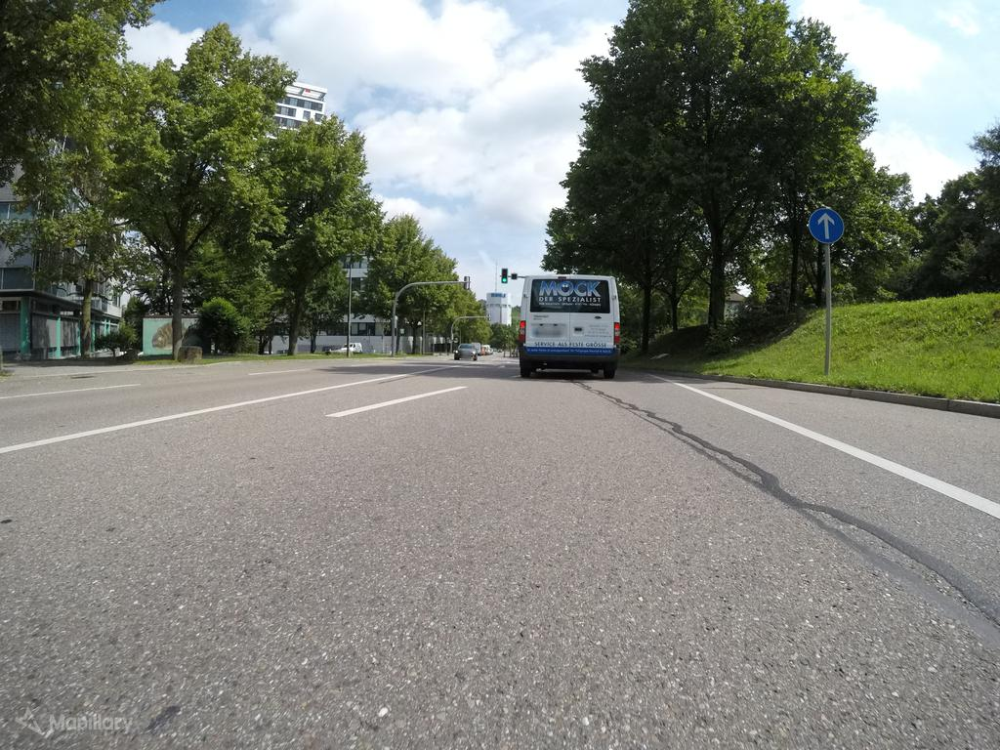

100%|██████████| 8/8 [01:06<00:00,  8.27s/it]


In [43]:
image_keys = ['JA_4AXrqoaIecJpViomBOA', 'OK3OH_L2Kdy1xir3UwOsCg', 'PB4u5tsj8QLY5TBV_iPA9w', '7b8gh4mSWWLxhzb1Qb_FIg', 'XXjX9AEefUvr-O73l44XAg', 'm_kiEGQis5-a9LhLgXw-1Q', 'gf5Mzjj6wh3HEEaTaficOw', 'X2rZ_IvYvrTTl2Xa1Bexng']
# image keys are from 8 random spots in stuttgart

img_files = {} # dict for storing all image files (key is image_key)
obj_detections = {} # dict for storing all object detections (key is image_key)

for image_key in tqdm(image_keys): # loop through all image keys

    # we will use a template link that shows a JPG from Mapillary, and insert the key
    image = base_image_url.format(image_key)

    # request the image URL, to get a displayable image
    r = requests.get(image,stream=all)
    
    if r.status_code == 200:
        save_name = f'{save_path}{image_key}.jpg'
        img_files[image_key] = save_name # save savename for easier use of the cropping function
        print(save_name)
        with open(save_name, 'wb') as f:
            f.write(r.content)

        # use the display module to print the retrieved image
        display(Image(r.content))
        
        # Request object detections
        r_seg = requests.get(link_seg.format(image_key), timeout=None)
        if r.status_code == 200: # check status of request (200=ok)
            obj_detections[image_key] = r_seg.json() # save obkect detections for easier use of the cropping function
        else:
            print(f'ATTENTION: no segments found for image key {image_key}')
    else:
        print(f'ATTENTION: no image found for image key {image_key}')
    
    

## Define function for cropping images

In [44]:
# final function: takes image & object detections as input, returns cropped image as output
def crop_image_flat(img_file, obj_detections, output_folder, debug=False):
    """
    Crops a given image to an axis-parallel rectangle which contains all object dectections of a 'flat' type

    Parameters:
        img_file: path to image downloaded from mapillary
        obj_dectections: json containing object detections as downloaded from mapillary
        output_folder: folder to save cropped image in
        debug: switch for verbose output, default = False 

    Returns:
        None  
    """
    
    # Get min and max x and y coordinates for all flat segments associated with the given image
    segments_flat = [(d['properties']['image_key'], 
                 d['properties']['value'], 
                 d['properties']['shape']['coordinates'], 
                 d['properties']['score']) 
                for d in obj_detections['features'] if d['properties']['value'].startswith('construction--flat--')]
    
    coords = [point for seg in segments_flat for point in seg[2][0]] # get all points of all flat segments
    x_coords = [point[0] for point in coords] # filter out x coordinates
    y_coords = [point[1] for point in coords]# filter out y coordinates
    x_min, x_max, y_min, y_max = min(x_coords), max(x_coords), min(y_coords), max(y_coords) # careful: these are scaled between 0 and 1
    
    # Open and crop the image
    img = PILImage.open(img_file)
    width, height = img.size
    cropped_image = img.crop((x_min * width, y_min * height, x_max * width, y_max * height))
    
    # Create output filename and save cropped image
    out_file = Path(img_file).stem
    cropped_image.save(f'{output_folder}/{out_file}.jpg') # save cropped image in output_folder under same name as input image
    
    if debug:
        print('################################')
        print(img_file)
        print('Original image')
        display(img)
        print('Cropped image')
        display(cropped_image)
        print(x_min, x_max, y_min, y_max)
        print(x_min * width, y_min * height, x_max * width, y_max * height) # multiply by width and height in order to get image coordinates
        
    return     

## Test cropping function on test data set

################################
../data/raw/mapillary_1024/JA_4AXrqoaIecJpViomBOA.jpg
Original image


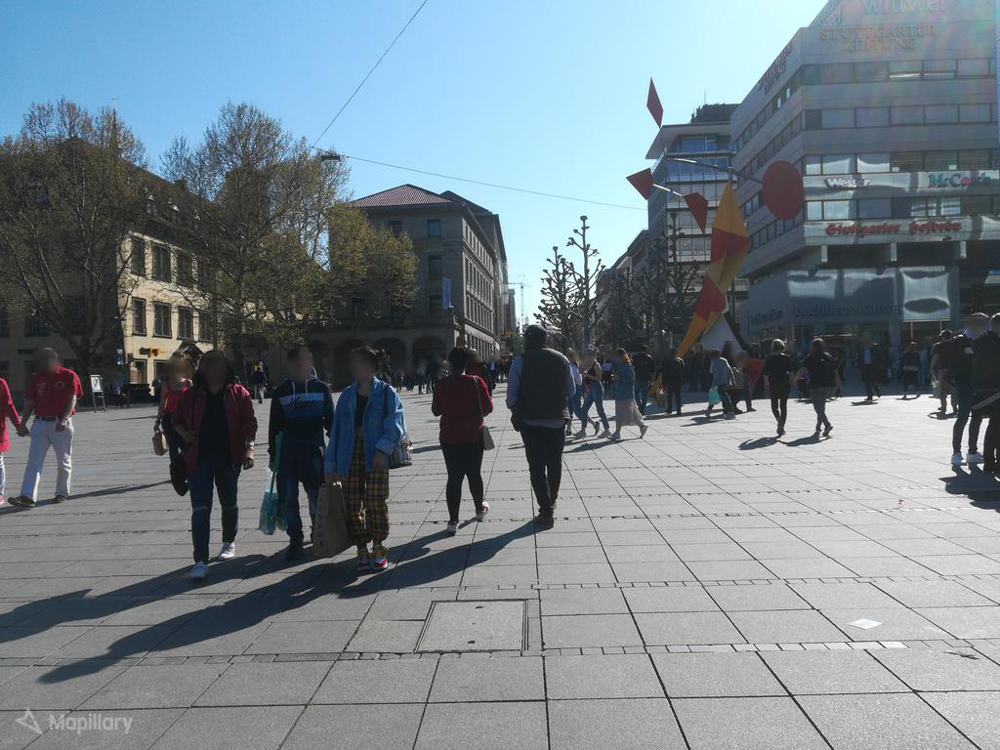

Cropped image


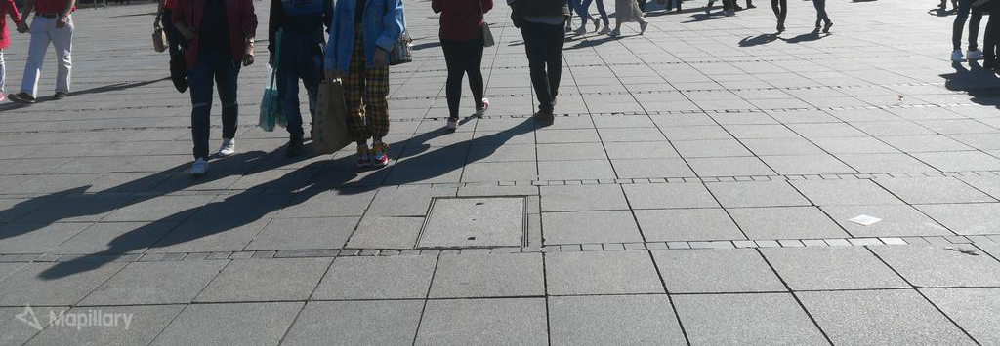

0 1 0.538330078125 1
0 413.4375 1024 768
################################
../data/raw/mapillary_1024/OK3OH_L2Kdy1xir3UwOsCg.jpg
Original image


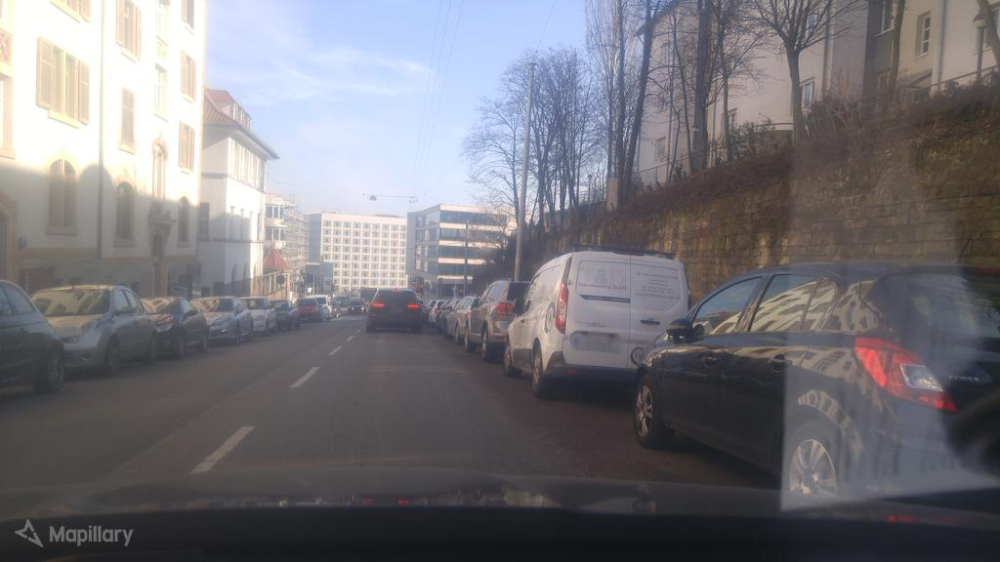

Cropped image


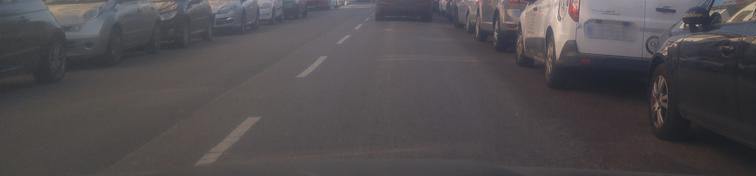

0 0.73779296875 0.556396484375 0.8603515625
0 320.484375 755.5 495.5625
################################
../data/raw/mapillary_1024/PB4u5tsj8QLY5TBV_iPA9w.jpg
Original image


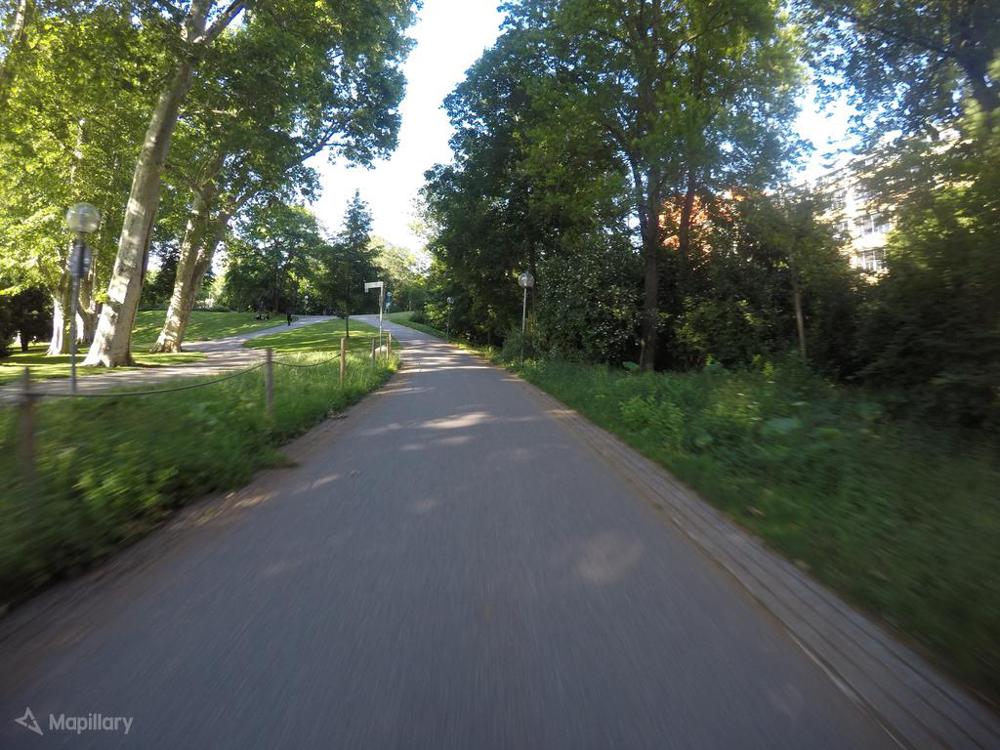

Cropped image


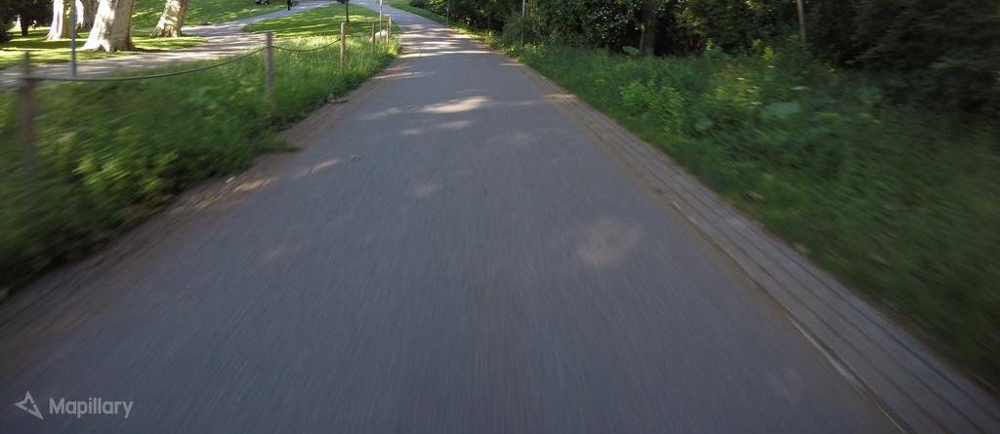

0 1 0.421142578125 1
0 323.4375 1024 768
################################
../data/raw/mapillary_1024/7b8gh4mSWWLxhzb1Qb_FIg.jpg
Original image


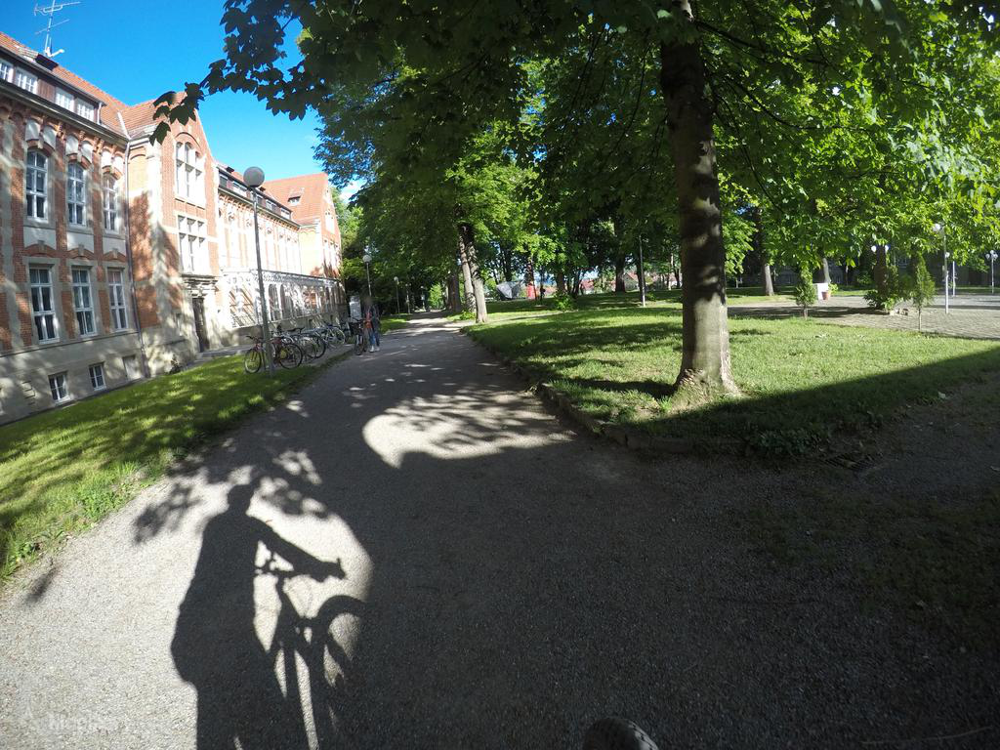

Cropped image


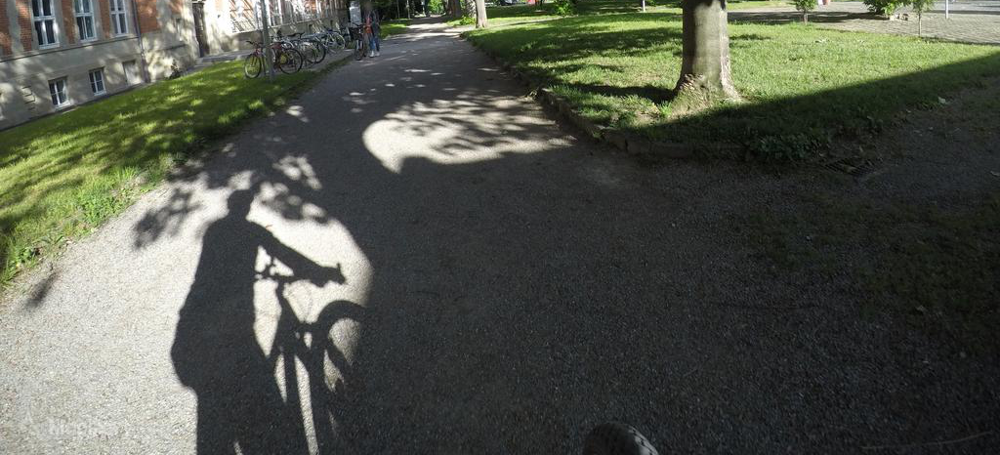

0 1 0.393310546875 1
0 302.0625 1024 768
################################
../data/raw/mapillary_1024/XXjX9AEefUvr-O73l44XAg.jpg
Original image


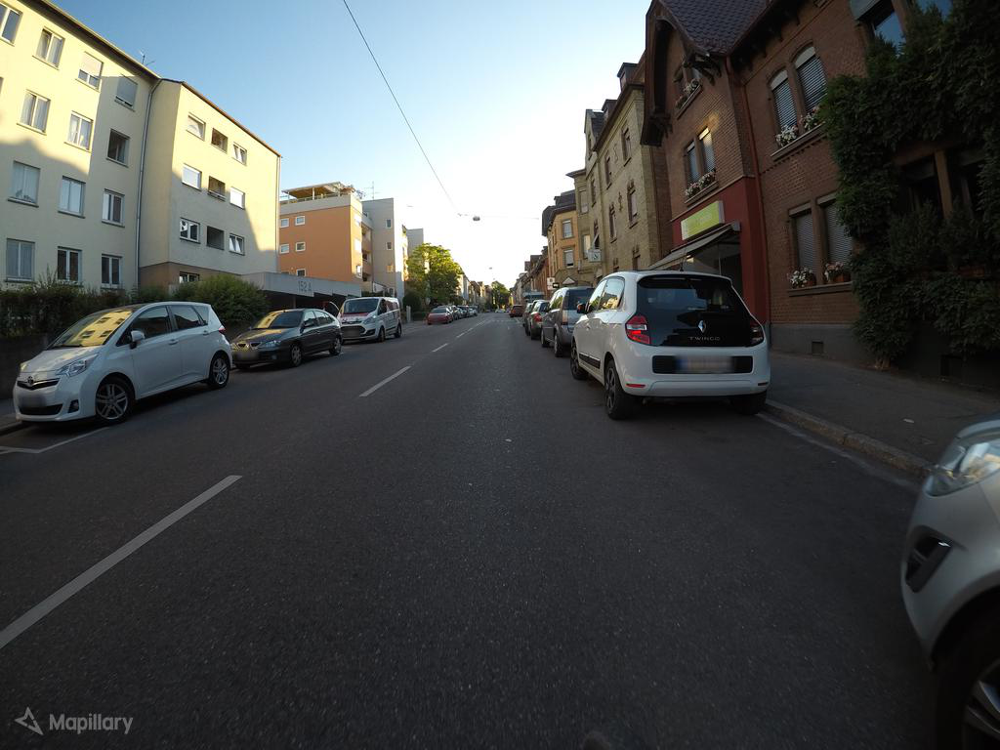

Cropped image


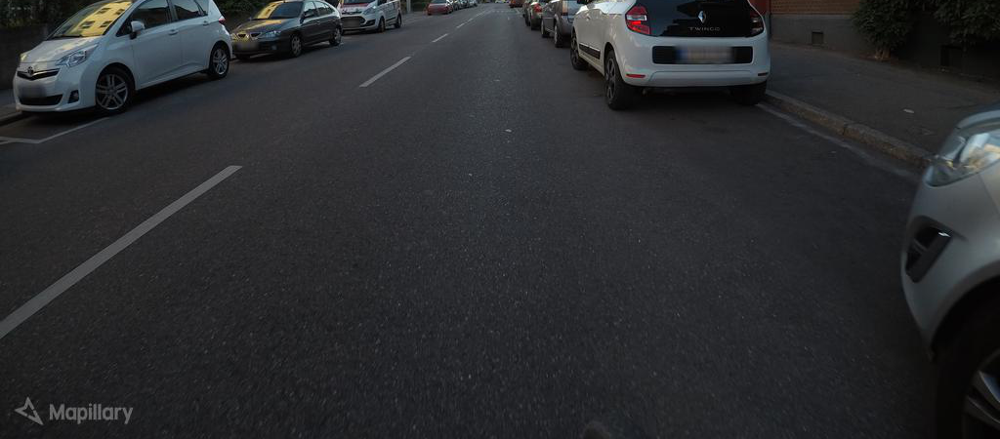

0 1 0.413330078125 0.998779296875
0 317.4375 1024 767.0625
################################
../data/raw/mapillary_1024/m_kiEGQis5-a9LhLgXw-1Q.jpg
Original image


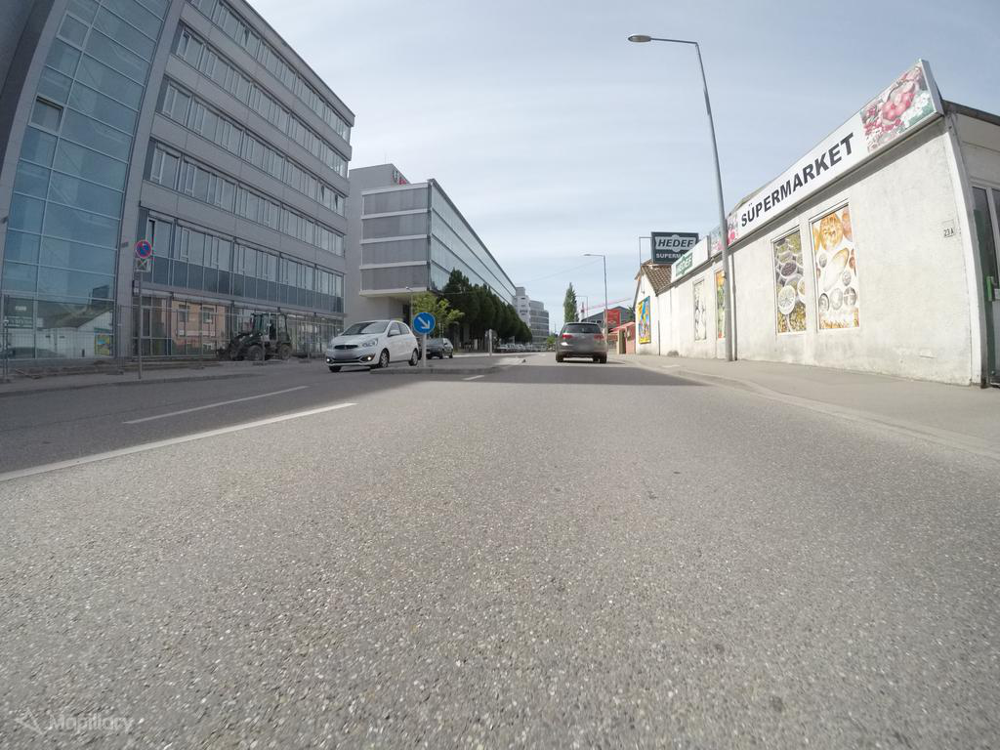

Cropped image


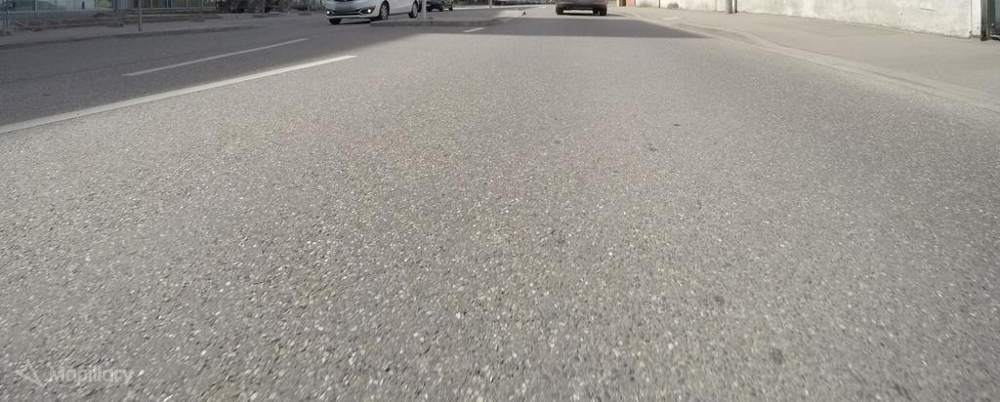

0 0.999755859375 0.46337890625 0.999755859375
0 355.875 1023.75 767.8125
################################
../data/raw/mapillary_1024/gf5Mzjj6wh3HEEaTaficOw.jpg
Original image


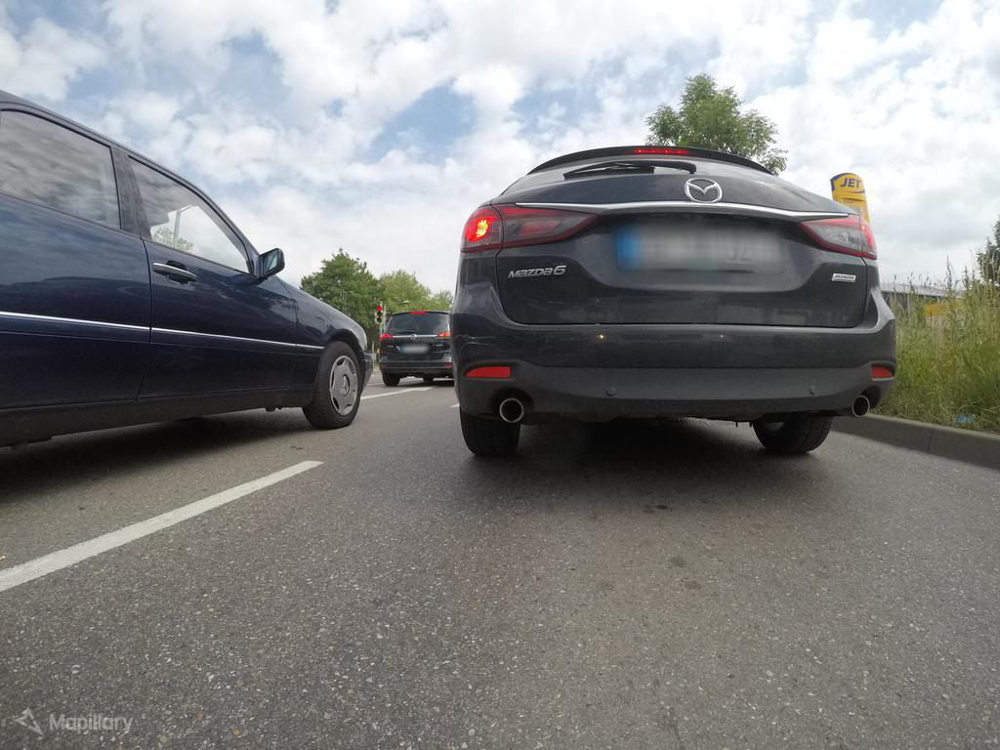

Cropped image


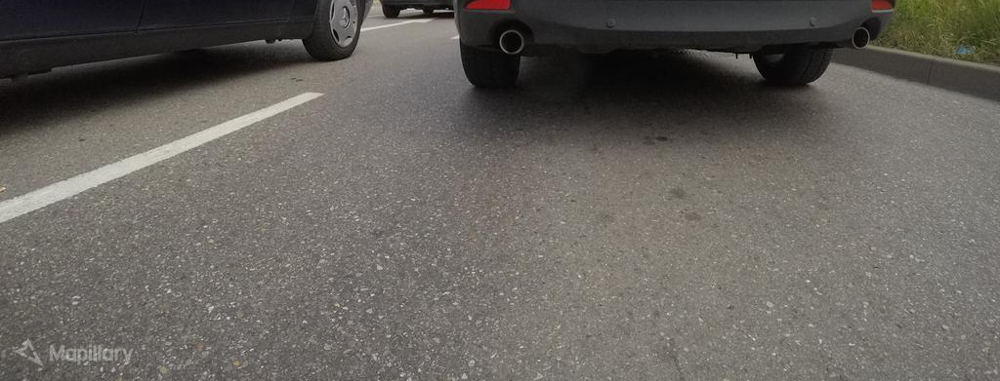

0 0.999755859375 0.491455078125 0.999755859375
0 377.4375 1023.75 767.8125
################################
../data/raw/mapillary_1024/X2rZ_IvYvrTTl2Xa1Bexng.jpg
Original image


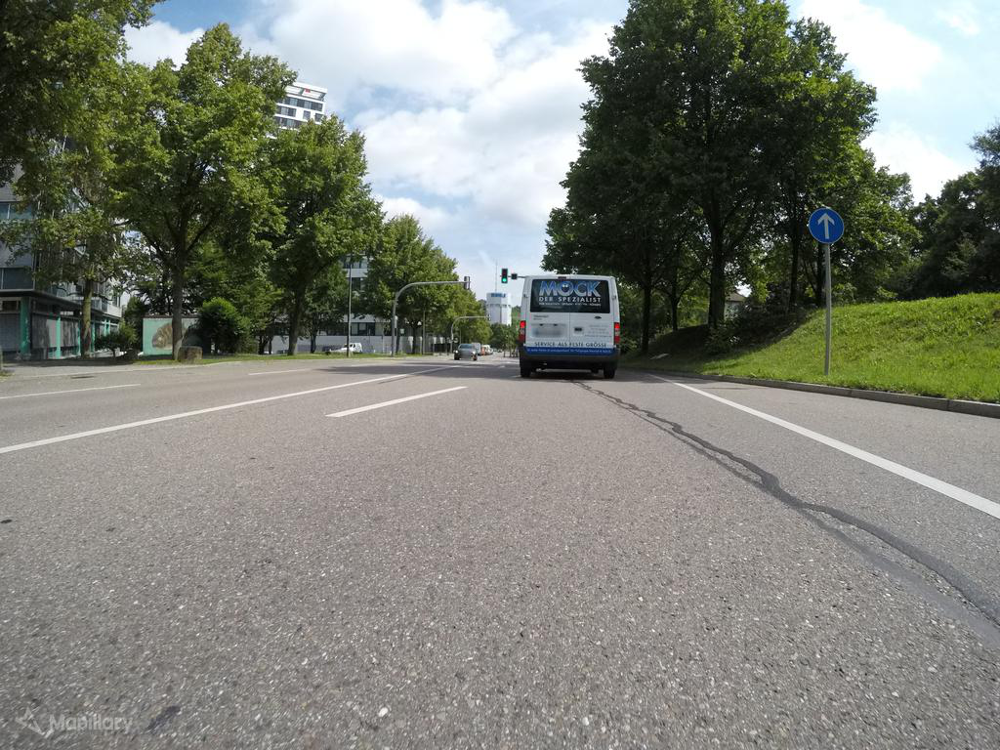

Cropped image


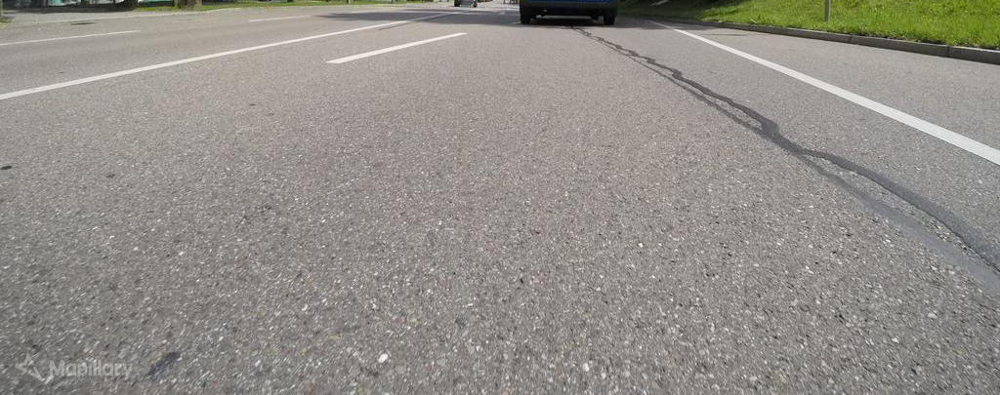

0 0.999755859375 0.47119140625 0.9990234375
0 361.875 1023.75 767.25


In [45]:
output_folder = '../data/processed'
for img_key in img_files:
    cropped_image = crop_image_flat(img_files[img_key], obj_detections[img_key], output_folder, debug = True)

## Code for getting image ids for locations (latitude and longitude from mapillary)

In [39]:
# retrieve feature collection containing infos about all images close to given latitude and longitude from mapillary
lat=48.808300699972
lng=9.1794059
#test_lat, test_lon = 48.77847038008697, 9.178274812488452
url = (f'{base}/images?client_id={client_id}&closeto={lng},{lat}&per_page=500&sort_by=key') 
r = requests.get(url, timeout=None)
print(r.status_code) # check status of request (200=ok)
data = r.json() # retrieve data as json from request
data

200


{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'ca': 359,
    'camera_make': 'GoPro',
    'camera_model': 'HERO5 Black',
    'captured_at': '2017-08-02T11:55:51.000Z',
    'key': 'X2rZ_IvYvrTTl2Xa1Bexng',
    'pano': False,
    'sequence_key': 'ue8w9f8az7xgq1yg8f10ee',
    'user_key': 'ghVXYxVzTVSq26zvGiz_0Q',
    'username': 'slabby',
    'quality_score': 5},
   'geometry': {'type': 'Point', 'coordinates': [9.1794059, 48.8083007]}},
  {'type': 'Feature',
   'properties': {'ca': 359,
    'camera_make': 'GoPro',
    'camera_model': 'HERO5 Black',
    'captured_at': '2017-08-02T11:55:51.000Z',
    'key': 'nZHm6RUncktX5R-bDVMh2w',
    'pano': False,
    'sequence_key': 'pw7eiyod9edqy42qlni3sm',
    'user_key': 'ghVXYxVzTVSq26zvGiz_0Q',
    'username': 'slabby',
    'quality_score': 5},
   'geometry': {'type': 'Point', 'coordinates': [9.1794059, 48.8083007]}},
  {'type': 'Feature',
   'properties': {'ca': 235.15977152617018,
    'camera_make': 'Apple',
  